## 5. Combining vector with raster data - spatial analysis

In this class, we will learn how to bring raster data into Python, combine it with vector data of our interest, aggregate information from the raster into the latter with zonal statistics, formulate a research question, and tackle it with the material acquired in class.

In [2]:
# %install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon, MultiPoint
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement
%matplotlib inline
ox.config(log_console=False, use_cache=True)
%config IPCompleter.greedy=True
import contextily as ctx
import rasterio

In [3]:
# in case of encountering problems with GEOS or GDAL, disable speedups from shapely
from shapely import speedups
speedups.disable()

Milan coordinate reference system:  epsg:4326
Projected Milan coordinate reference system:  +proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


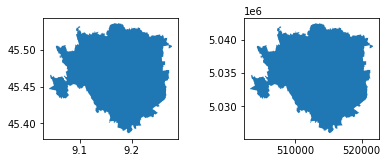

In [4]:
# load Milan city from openstreetmap using osmmnx api

city_name = 'Milan, Italy'
city = ox.geocode_to_gdf(city_name)
print('Milan coordinate reference system: ', city.crs)

# project to the local crs
city_proj = ox.projection.project_gdf(city)
print('Projected Milan coordinate reference system: ', city_proj.crs)

fig, (ax1, ax2) = plt.subplots(1, 2)
city.plot(ax=ax1, ec='none')
city_proj.plot(ax=ax2, ec='none' )
plt.tight_layout(pad=3.0)
plt.show()

In [5]:
# convert to "ESRI:54009" coordinate system, since that's the system NASA uses
city = city.to_crs("ESRI:54009") 
print(city.crs)

ESRI:54009


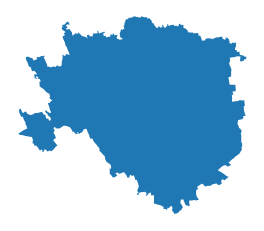

In [6]:
# plot city in new projection
ax = city.plot(ec='none')
_ = ax.axis('off')

In [7]:
# save to file
city.to_file('../data/Milan_54009.shp')

<ipython-input-7-f807795aa9f6>:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  city.to_file('../data/Milan_54009.shp')


In [8]:
# load the saved file
import fiona
with fiona.open("../data/Milan_54009.shp", "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

In [9]:
# load the NASA population density raster file
# Data source: https://sedac.ciesin.columbia.edu/data/collection/gpw-v4
import rasterio.mask
with rasterio.open("../data/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0.tif") as src:
    # since the NASA data is for the entire world, we will use the 'shapes' polygon containing our city to mask out
    # the population raster data corresponding to our city
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True, nodata=0)
    out_meta = src.meta

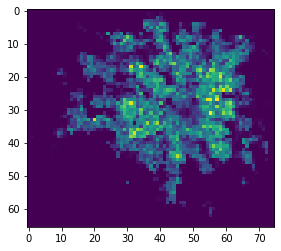

In [10]:
# plot city population 
plt.imshow(out_image[0,:,:])
plt.show()

In [11]:
# since the raster array contains many dimensions, we assign the dimension containing the population density data to a new 
# variable
pop_density = out_image[0,:,:]
pop_density

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [12]:
# just in case, set all negative values to zero
pop_density[pop_density < 0] = 0

In [13]:
# split city into 400 x 400 meter grid cells
geometry = city_proj['geometry'].iloc[0]
print(type(geometry))
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width = 400)
print(type(geometry_cut))

<class 'shapely.geometry.polygon.Polygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>


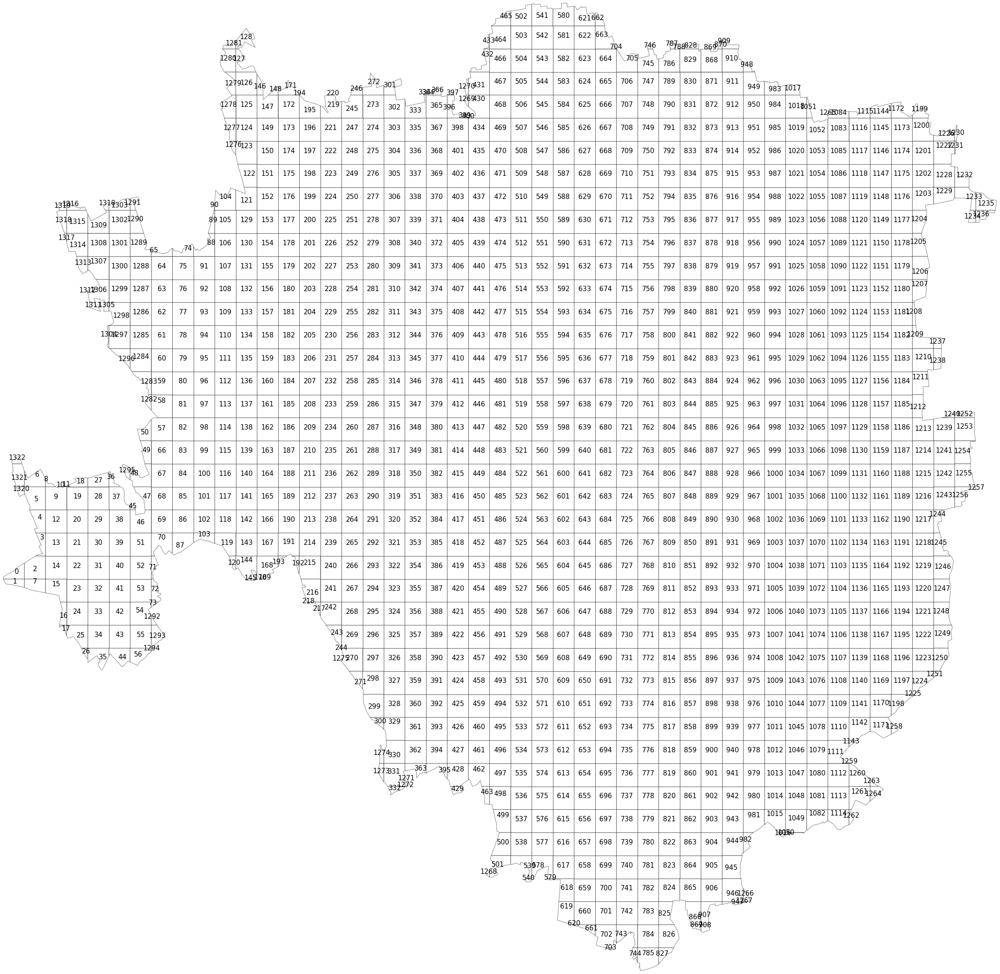

In [14]:
polylist = [p for p in geometry_cut]

# plot city
west, south, east, north = city_proj.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=15)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [15]:
# create geodataframe from the square grid polygons
polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city_proj.crs
print(polyframe.crs)
polyframe.head()

+proj=utm +zone=32 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((503197.317 5032658.859, 503202.066 5..."
1,"POLYGON ((503591.542 5032635.490, 503591.542 5..."
2,"POLYGON ((503591.542 5032909.514, 503804.443 5..."
3,"POLYGON ((503804.443 5033029.836, 503837.189 5..."
4,"POLYGON ((503807.363 5033424.181, 503777.065 5..."


<AxesSubplot:>

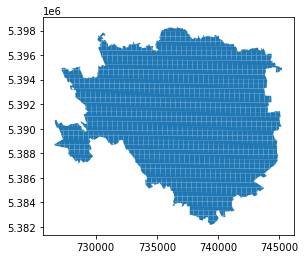

In [16]:
# convert to the NASA crs we introduced earlier
polyframe= polyframe.to_crs(city.crs)
polyframe.plot()

In [17]:
# load library for aggregating raster data into vector polygons
from rasterstats import zonal_stats

In [18]:
# compute the mean value of all raster values that fall into a given quadratic cell

affine = out_transform
city_stats = zonal_stats(polyframe, pop_density, affine=affine, stats='mean', nodata=0)
pop_array = np.array([list(item.values())[0] if list(item.values())[0] is not None else 0 for item in city_stats])
print(pop_array)

[40.32780457  4.24924612  0.74573342 ...  2.20441222  0.
  0.        ]


In [19]:
city_stats

[{'mean': 40.32780456542969},
 {'mean': 4.249246120452881},
 {'mean': 0.745733417570591},
 {'mean': 2.713408946990967},
 {'mean': None},
 {'mean': 24.005563735961914},
 {'mean': 0.096488818526268},
 {'mean': 0.8694548010826111},
 {'mean': None},
 {'mean': 3.5187740325927734},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': 0.724502682685852},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': 21.759761810302734},
 {'mean': 3.421448662877083},
 {'mean': 2.7175822257995605},
 {'mean': 1.7740891575813293},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': 3.0339407920837402},
 {'mean': None},
 {'mean': 3.360316753387451},
 {'mean': 98.44200897216797},
 {'mean': 6.231976538896561},
 {'mean': 5.43232274055481},
 {'mean': 24.54788303375244},
 {'mean': 8.500703060999513},
 {'mean': 11.36633586883545},
 {'mean': 3.0780813694000244},
 {'mean': None},
 {'mean': 0.4437682703137398},
 {'mean': 327.17659250895184},

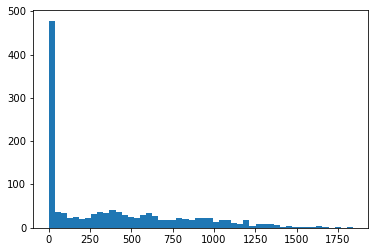

In [20]:
# plot histogram of the obtained population density values
plt.hist(pop_array, bins=50)
plt.show()

As we can see, it's a skewed distribution, with most locations having a small population, while a few locations at the tail of th distributions containing a large population.

In [21]:
# assign the population values as a new column in the geodataframe with the grid cells, 
# so we know which grid cell has what population.

polyframe["population"] = pop_array
polyframe.head()

,geometry,population
0,"POLYGON ((726632.539 5388716.142, 726636.552 5...",40.327805
1,"POLYGON ((727039.421 5388693.181, 727050.077 5...",4.249246
2,"POLYGON ((727019.603 5388959.985, 727229.731 5...",0.745733
3,"POLYGON ((727229.731 5389077.013, 727262.051 5...",2.713409
4,"POLYGON ((727204.215 5389460.956, 727168.253 5...",0.000000


(256, 4)
[[1.         0.96078431 0.94117647 1.        ]
 [0.99987697 0.95820069 0.93748558 1.        ]
 [0.99975394 0.95561707 0.93379469 1.        ]
 ...
 [0.41917724 0.00369089 0.05294887 1.        ]
 [0.4115494  0.00184544 0.05196463 1.        ]
 [0.40392157 0.         0.05098039 1.        ]]


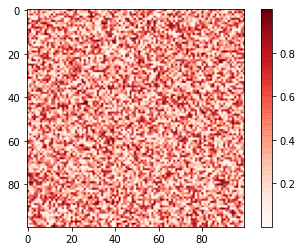

In [22]:
# in order to achieve a nice-looking visualisation, let's create a custom colormap, that fades away into transparency

ncolors = 256
# get cmap
color_array = plt.get_cmap('Reds')(range(ncolors))
print(color_array.shape)
print(color_array)

# change alpha values
color_array[:, -1] = np.linspace(0.3, 1, ncolors)

# create colormap object
import matplotlib.colors as colors
from matplotlib.colors import LinearSegmentedColormap

map_object = LinearSegmentedColormap.from_list(name="Reds_transp", colors=color_array)

# register the colormap object
plt.register_cmap(cmap=map_object)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap='Reds_transp')
plt.colorbar(mappable=h)

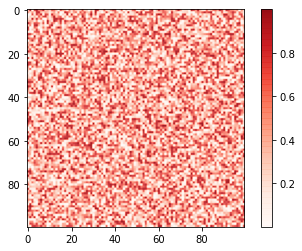

In [23]:
# let's cut it at the top for a better visual impact

def trunc_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = LinearSegmentedColormap.from_list('trunc({n}, {a:.2f}, {b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
                                                cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = plt.get_cmap('Reds_transp')
new_cmap = trunc_colormap(cmap, 0.0, .9)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap=new_cmap)
plt.colorbar(mappable=h)

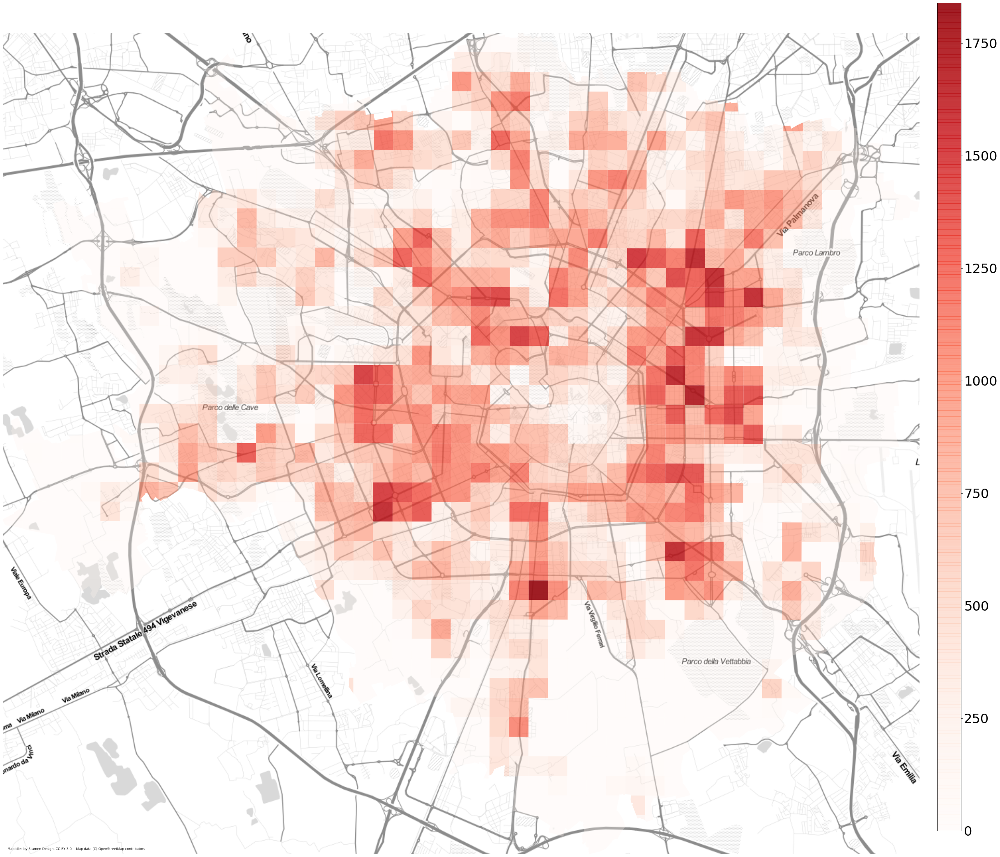

In [24]:
# plot the population density data on a map background
plt.rcParams.update({'font.size':32})
import contextily as ctx
# ctx uses epsg:3857
polyframe_3857 = polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

#ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
fig, ax = plt.subplots(figsize=(40,40))
polyframe_3857.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_3857.population), vmax=max(polyframe_3857.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

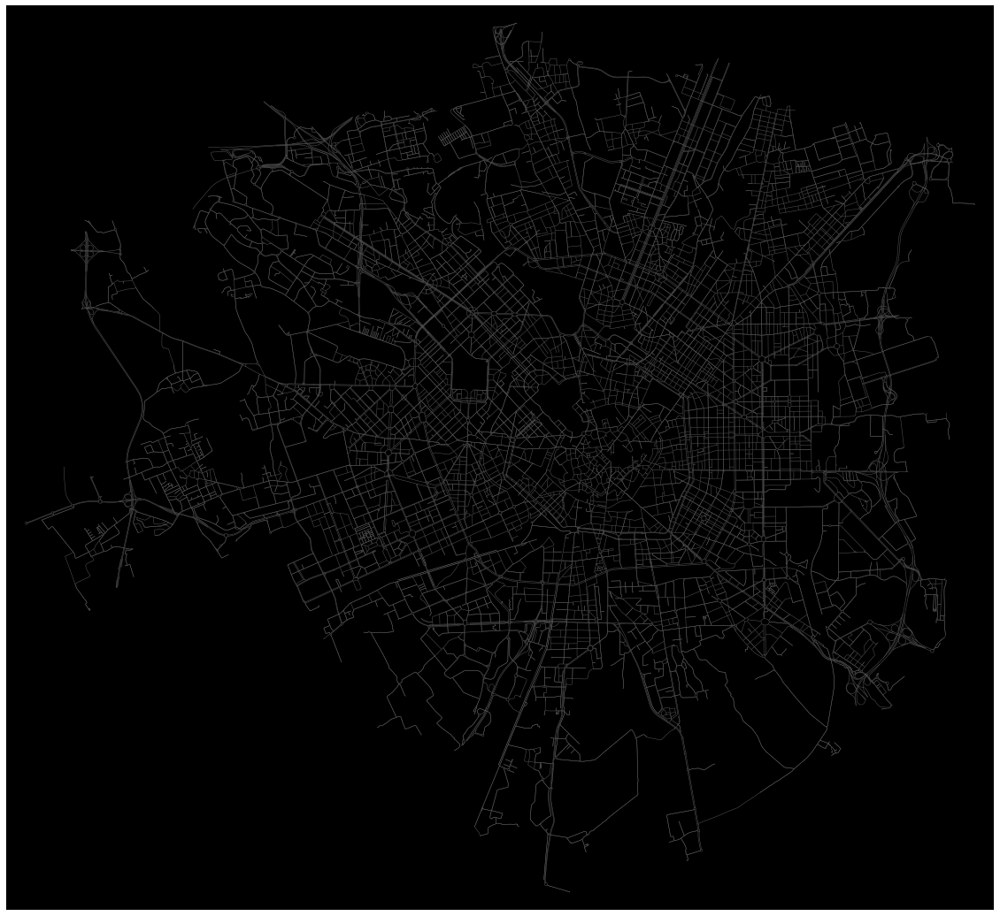

In [25]:
# download and project a street network
G = ox.graph_from_place(city_name, network_type="drive")
#G = ox.project_graph(G)
fig, ax = ox.plot_graph(G, figsize=(20,20), bgcolor='k', node_size=0, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=0.5, edge_alpha=1)

In [26]:
from pyproj import CRS
crs = CRS.from_epsg(4326)
polyframe_gps = polyframe.to_crs(crs)
print(polyframe_gps.crs)

epsg:4326


Now, let's overlay the street network on top of the population data for a visually pleasing result.

<ipython-input-27-af18cd3c6ffd>:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


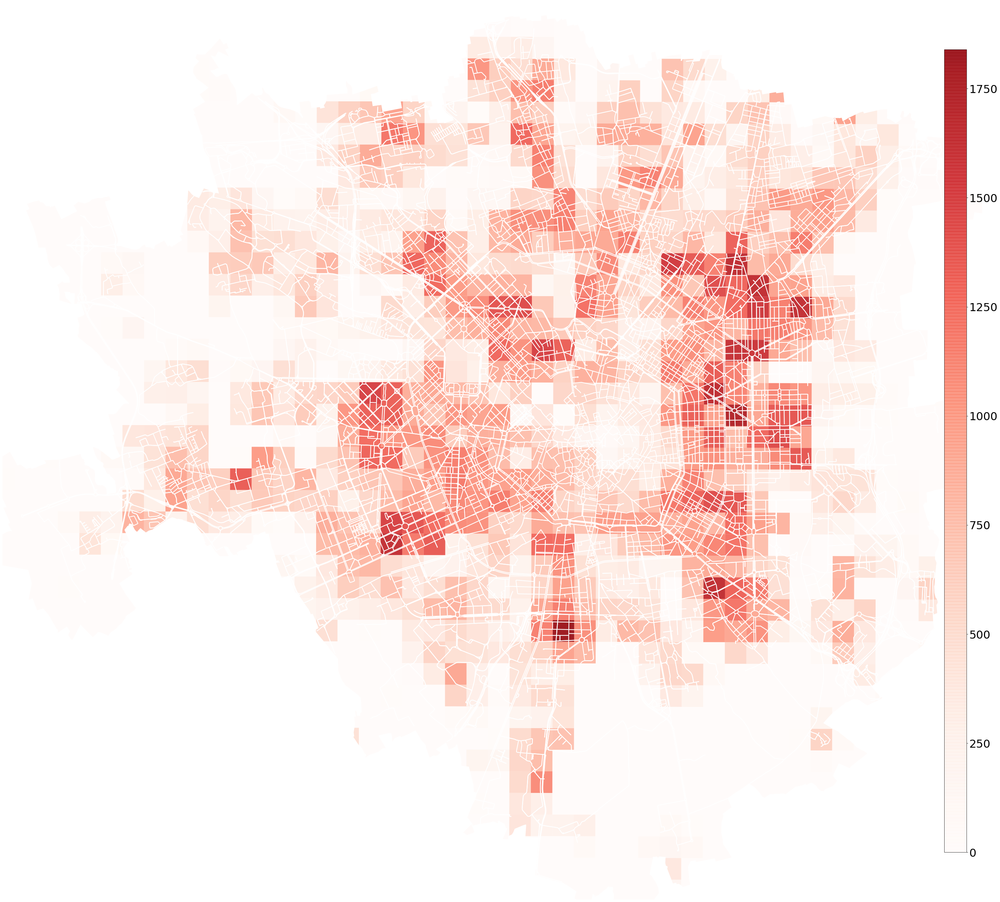

In [27]:
fig, ax = plt.subplots(figsize=(40,40))

#plt.close()
polyframe_gps.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

ox.plot_graph(G, ax=ax, figsize=(40,40),show=False, close=False, \
              node_color='grey', node_size=0, edge_linewidth=2.25, node_alpha=0.8, node_zorder=10, edge_color='white')

cbax = fig.add_axes([0.95, 0.1, 0.0225, 0.8])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_gps.population), vmax=max(polyframe_gps.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ax.axis('off')
plt.tight_layout()
#plt.savefig('../data/Milan_pop_density_with_streets.jpg', dpi=150)
plt.show()

### Street network density

In [29]:
# let's get a list containing the street network node IDs
graph = G.nodes(data=True)
nodelist = [x[0] for x in graph]
nodelist[:10]

[10371529,
 10371530,
 13595397,
 13598756,
 13598788,
 13919619,
 13919627,
 13919638,
 13919640,
 13919646]

In [30]:
# then, we create a dataframe containing features of the street nodes (junctions)
from tqdm import tqdm
street_dict = {'osmid':[], 'lon':[], 'lat':[], 'street_count':[]}
for node in tqdm(nodelist):
    street_dict['osmid'].append(node)
    street_dict['lon'].append(graph[node]['x'])
    street_dict['lat'].append(graph[node]['y'])
    street_dict['street_count'].append(graph[node]['street_count'])
    
street_frame = pd.DataFrame(street_dict)
street_frame.head(10)

100%|██████████████████████████████████████████████████████████████████████| 13075/13075 [00:00<00:00, 246788.16it/s]


,osmid,lon,lat,street_count
0,10371529,9.076625,45.487563,3
1,10371530,9.102055,45.479804,3
2,13595397,9.130656,45.499516,4
3,13598756,9.163773,45.482751,4
4,13598788,9.157376,45.487319,3
5,13919619,9.156166,45.484810,3
6,13919627,9.157687,45.487773,5
7,13919638,9.160314,45.490487,3
8,13919640,9.153752,45.486130,4
9,13919646,9.165737,45.490573,4


In [31]:
# let's create Point geometries from the lat, lon pairs. You have seen this many times before
geometry = [Point(xy) for xy in zip(street_frame.lon, street_frame.lat)]
street_frame = street_frame.drop(['lon', 'lat'], axis=1)
gdf = gpd.GeoDataFrame(street_frame, crs=crs, geometry=geometry)
gdf.tail()

,osmid,street_count,geometry
13070,8856646217,3,POINT (9.26306 45.43300)
13071,8856646224,4,POINT (9.25557 45.44725)
13072,8856646251,3,POINT (9.24014 45.44010)
13073,8871204317,3,POINT (9.15331 45.49522)
13074,8871204319,3,POINT (9.15379 45.49485)


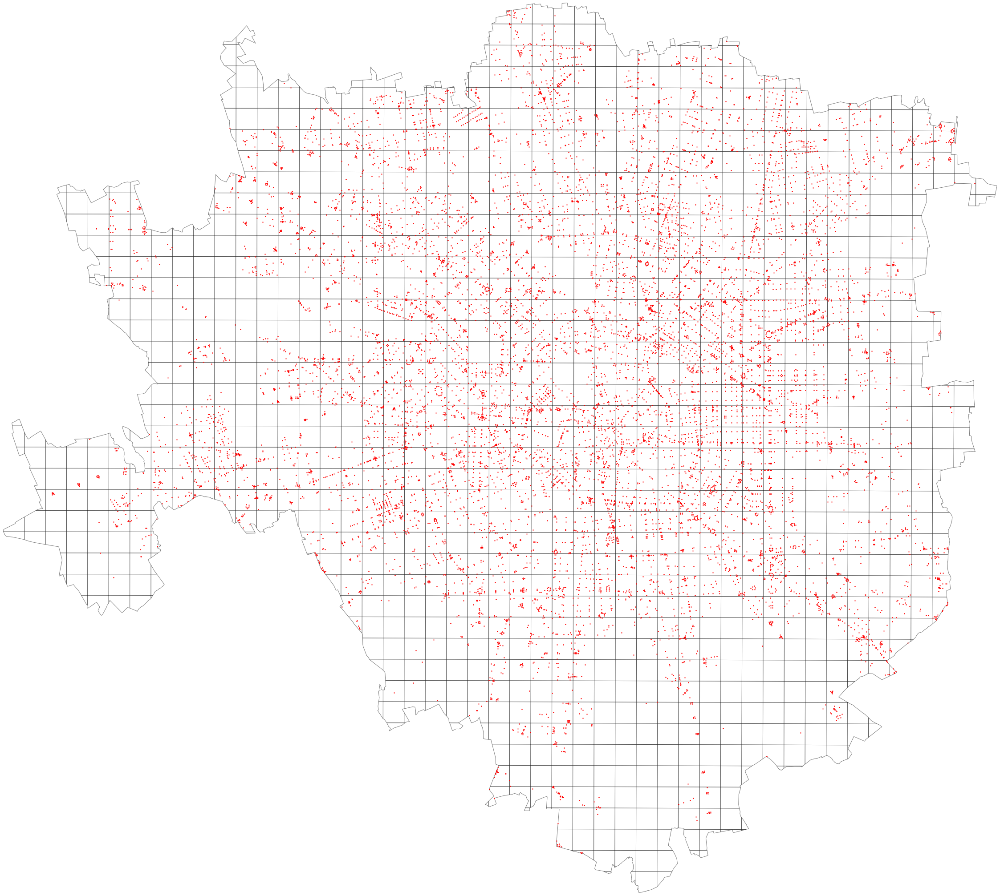

In [32]:
west, south, east, north = polyframe_gps.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(polyframe_gps.geometry, np.arange(len(polyframe_gps))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5)
    ax.add_patch(patch)
#     plt.annotate(s=n, xy=p,
#                  horizontalalignment='center', size=7)
gdf.plot(ax=ax, color='red', markersize=2, zorder=2)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

Now, we will start computing the street node density aggregated by the quadratic cells the city has been divided into.

In [33]:
pointInPoly = gpd.sjoin(polyframe_gps, gdf, op='contains')
print(len(pointInPoly))
pointInPoly.head(10)

13064


,geometry,population,index_right,osmid,street_count
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,5098,273512549,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,10030,2268397492,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,11002,2720117948,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,11003,2720117950,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,10039,2268397749,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,10032,2268397617,3
13,"POLYGON ((9.05602 45.45433, 9.05601 45.45078, ...",0.724503,10035,2268397659,3
20,"POLYGON ((9.06106 45.45788, 9.06106 45.45433, ...",2.717582,10040,2268397755,3
20,"POLYGON ((9.06106 45.45788, 9.06106 45.45433, ...",2.717582,7107,595649878,3
20,"POLYGON ((9.06106 45.45788, 9.06106 45.45433, ...",2.717582,10042,2268397862,3


In [34]:
streetcounts = pointInPoly.groupby(pointInPoly.index)['index_right'].count()
counts = pd.DataFrame(streetcounts)
counts.columns = ['counts']
counts

,counts
13,7
20,8
27,1
29,8
31,1
...,...
1300,4
1301,10
1302,8
1305,1


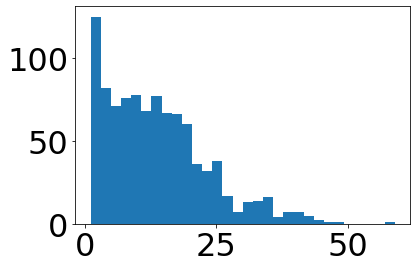

In [35]:
# a quick histogram of the street node counts
plt.hist(counts.counts, bins=30)
plt.show()

In [36]:
polycounts = polyframe_gps.copy()
polycounts['counts'] = counts.counts
polycounts['counts'].fillna(0, inplace=True)
polycounts['counts'] = polycounts['counts'].astype(int)
polycounts

,geometry,population,counts
0,"POLYGON ((9.04089 45.44745, 9.04095 45.44755, ...",40.327805,0
1,"POLYGON ((9.04593 45.44723, 9.04593 45.44591, ...",4.249246,0
2,"POLYGON ((9.04593 45.44970, 9.04865 45.45078, ...",0.745733,0
3,"POLYGON ((9.04865 45.45078, 9.04907 45.45095, ...",2.713409,0
4,"POLYGON ((9.04869 45.45433, 9.04831 45.45493, ...",0.000000,0
...,...,...,...
1318,"POLYGON ((9.05555 45.50047, 9.05543 45.50074, ...",0.000000,0
1319,"POLYGON ((9.05440 45.50402, 9.05385 45.50486, ...",0.656113,0
1320,"POLYGON ((9.04594 45.46031, 9.04475 45.45995, ...",2.204412,0
1321,"POLYGON ((9.04404 45.46143, 9.04297 45.46369, ...",0.000000,0


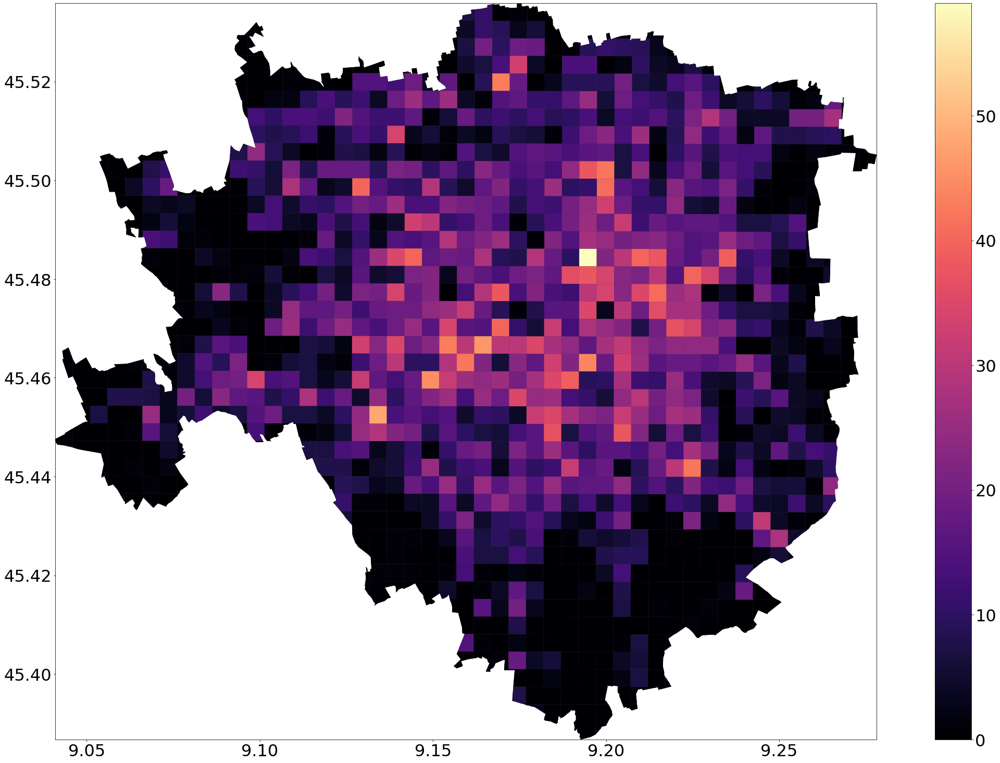

In [37]:
# plot the city
west, south, east, north = polycounts.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polycounts.plot(column='counts',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

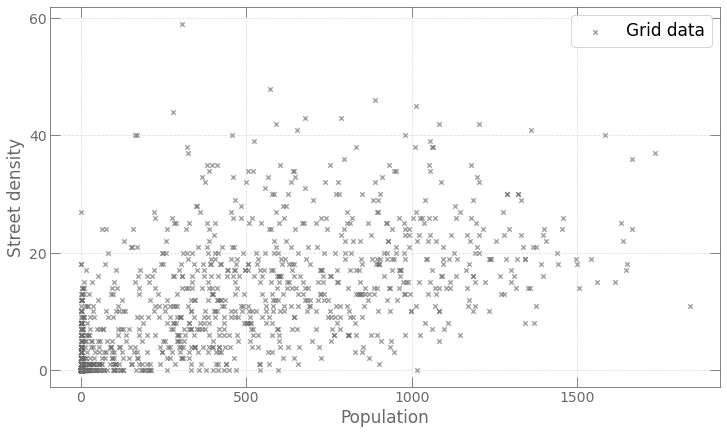

In [38]:
fig, ax = plt.subplots(figsize=(12, 7))
ax.scatter(polycounts.population, polycounts.counts, alpha=0.6, color='dimgrey',\
           zorder=1, marker='x', label = "Grid data", s=20)

ax.legend(prop={'size': 17})
plt.xlabel('Population', size=17, color='dimgrey')
plt.ylabel('Street density', size=17, color='dimgrey', rotation=90)

ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')
ax.tick_params(direction="in", size=10)
ax.spines['bottom'].set_color('dimgrey')
ax.spines['top'].set_color('dimgrey') 
ax.spines['right'].set_color('dimgrey')
ax.spines['left'].set_color('dimgrey')
ax.tick_params(axis='x', colors='dimgrey')
ax.tick_params(axis='y', colors='dimgrey')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
ax.grid(alpha=0.4,ls='--')
# plt.savefig('pop_dens_milan.jpg', dpi=120)
# plt.show()

We can visually identify a weak correlation between population density and street network density in Milan. However, to find out if it is statistically significant, you can optionally run a simple regression analysis.

### Homework assignments

1. Analyse and plot a (correlation) scatter plot between the population density of Yerevan and GG Taxi demand using a grid size of your choice (anything from ~300 to 1000 meters).
2. Conduct the same analysis as above, except in place of node density per grid cell, use edge density per grid cell.

Complete both tasks in a clean Jupyter Notebook, name the notebook **< Name > < Surname > Class 5 Homework** and upload it to Moodle.